# **COVID19 - Trends and Outbreak Prediction of Spread in USA and India**

Name : Ragunath Gunasekaran

Professor Name : Dr. Brett Werner

Course Name : DSC630-T302 Predictive Analytics

#### Project Goal :  Develop COVID19 Data Tracker Tool with Key Performance Indicators (KPI), Trends, Geographic and Various visualizations, Prediction of CoronaVirus in the USA and India by using COVID19 Datasets and Python Programming Language.  

#### Project Purpose :  By using the  COVID19 Data Tracker , end users can see the current spread and future forecast details across the country along with various entities like Ethnicity, Geographic , Income Etc. Also COVID19 Data Tracker, will alert the end users with trends on Daily and Monthly Changes.

#### Research Questions : 

1. Daily Confirmed, new Confirmed and Death cases Analysis by Country, State, County

2. Predict the Corona Cases and Death 

3. State Level Counts of Corona virus, Comparison between States

4. Calculate Recovery and Death Rates, Deaths per 100k

5. Number of Corona Cases comparison : Positive vs Negative

6. Testing Count Details by Country, State, County

7.  Count of patients : Infected by Virus and Deaths

## Introduction: 
As of today ( June 5th 2021) , Corona cases in USA as below. 

1. Number of Cases - 3.3 M

2. Number of Deaths - 598 K

The Analyses of current and future Spread is very important step in facing this pandemic situation.  This Analysis will help Government/Local bodies plan for the next steps.

ithout predictive model, the only way to be sure to reach all of them is to reach every single customer. Instead of that, we can build accurate predictive model and we can target much more effective way.

Python as a programming language has numerous uses such as Machine Learning, AI, mobile applications, statistical , etc. As we know, AI, machine learning, and data analysis/analytics is where it has amassed most of its popularity. 

Python contains more libraries and packages is continually being employed which helped to solve complex industry issues, data-driven strategies, risk analysis etc. Python contains more libraries and packages is continually being employed which helped to solve complex industry issues, data-driven strategies, risk analysis etc.

ARIMA and SARIMAX models used to predict and forecase the number of deaths and confirmed cases in this project.


In [ ]:
pip install pmdarima 

### Project Approaches:  

I am going to follow the below 4 steps in the Project. (Shown in below diagram below References)

1. Data Exploration

2. Data Cleaning and Preparation

3. Exploratory Data Analysis and Predictive Modeling
        Confirmed vs Deaths Count Analysis - Scatter Plot
        US Death vs Death Rate Percentage       
        Normal Probability - Mean, Standard Deviation Analysis
        PDF (probability density function) - Death Analysis with P-Values
        Correlation Verification - Confirmed Cases Vs Death Counts
        Confirmed vs Death cases with the Fitted line - Slope
        Hypothesis Test
        Linear Regression - Death vs Cases ( ordinary least squares )
        Logistic Regression Analysis of Death Rate with Confirmed, Death Cases
        Forecast using ARIMA Model
        Prediction of Confirmed Cases - ARIMA Model - Time Series Forecasting

4.  Conclusion

5.  References

###  Import Libraries

In [ ]:
# All Required Python Packages and Libraries - Import

# data processing
import pandas as pd

# linear algebra
import numpy as np

# data visualization
import seaborn as sns

import plotly.express as px
import plotly.graph_objects as go

from scipy.integrate import odeint
import scipy.stats as sp
import matplotlib.pyplot as plt
%matplotlib inline
import math
import bokeh 

from urllib.request import urlopen
import json

from dateutil import parser
from bokeh.layouts import gridplot
from bokeh.plotting import figure, show, output_file
from bokeh.layouts import row, column
from bokeh.resources import INLINE
from bokeh.io import output_notebook
from bokeh.models import Span
import warnings
warnings.filterwarnings("ignore")
output_notebook(resources=INLINE)

import datetime

# Machine Learning Models
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer

from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report


# Import the Arima 
from pmdarima import auto_arima
import datetime

## Datasets from NY Times and CDC USA Goverment website

https://aws.amazon.com/marketplace/pp/prodview-jmb464qw2yg74

https://www.cdc.gov/nchs/covid19/covid-19-mortality-data-files.htm


## Datasets from Kaggle and Novel Corona Virus Disease 2019 in India

https://www.kaggle.com/sudalairajkumar/covid19-in-india

###  Exploratory Data Analysis

Removing Null and NA Values

### Loading the data from Source file to Dataframe - Meta Data Verification

In [ ]:
# Data US Country Level
USCountry_DF = pd.read_csv('us.csv', index_col ='date', parse_dates = True)

# Data US States Level
USStates_DF = pd.read_csv('us-states.csv')

# Data US Counties Level
USCounties_DF = pd.read_csv('us-counties.csv')

# Data World Level
World_DF = pd.read_csv('covid_19_data.csv')


In [ ]:
##### Converts dates to a specific format
# Removing the data with NA data
USCountry_DF.cases.dropna()
USStates_DF.deaths.dropna()

# Removing the data with NA data
USStates_DF.state.dropna()
USStates_DF.date.dropna()
USStates_DF.cases.dropna()
USStates_DF.deaths.dropna()

print(" ***************************************************************************************** ")
USCountry_DF.info()
print("Size/Shape of the Country Level dataset: ",USCountry_DF.shape)
print("Size/Shape of the State Level dataset: ",USStates_DF.shape)
print("Size/Shape of the Counties Level dataset: ",USCounties_DF.shape)
print(" ***************************************************************************************** ")
print("Checking for null values:\n",USCountry_DF.isnull().sum())
print("Checking Data-type of each column: Country Level \n",USCountry_DF.dtypes)
print(" ***************************************************************************************** ")
print("Checking Data-type of each column: State Level \n",USStates_DF.dtypes)
print(" ***************************************************************************************** ")
USStates_DF.info()
#Dropping column as SNo is of no use, and "Country" contains too many missing values
#USCountry_DF.drop(["SNo"],1,inplace=True)
print(" ***************************************************************************************** ")
USCounties_DF.info()

 ***************************************************************************************** 
<class 'pandas.core.frame.DataFrame'>
Int64Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    500 non-null    datetime64[ns]
 1   deaths  500 non-null    int64         
 2   cases   500 non-null    int64         
dtypes: datetime64[ns](1), int64(2)
memory usage: 15.6 KB
Size/Shape of the Country Level dataset:  (500, 3)
Size/Shape of the State Level dataset:  (25204, 5)
Size/Shape of the Counties Level dataset:  (1384683, 6)
 ***************************************************************************************** 
Checking for null values:
 date      0
deaths    0
cases     0
dtype: int64
Checking Data-type of each column: Country Level 
 date      datetime64[ns]
deaths             int64
cases              int64
dtype: object
 ***********************************************************

In [ ]:
USCountry_DF.dropna()

,cases,deaths,fips,DeathRate
date,,,,
2021-06-03,33336374,595937,1762,0.02
2021-06-02,33316877,595321,1762,0.02
2021-06-01,33300002,594723,1762,0.02
2021-05-31,33277510,594203,1762,0.02
2021-05-30,33271953,594053,1762,0.02
...,...,...,...,...
2020-01-25,3,0,76,0.00
2020-01-24,2,0,70,0.00
2020-01-23,1,0,53,0.00


In [ ]:
USCountry_DF.head(5)

,date,deaths,cases
0,2020-01-21,0,1
1,2020-01-22,0,1
2,2020-01-23,0,1
3,2020-01-24,0,2
4,2020-01-25,0,3


### Summary Report - Confirmed Cases, Death Count at Date Level

In [ ]:
# Summary Dataset Based on the Date - Group by
#pivot - rows into columns based on date
USCountry_DF = pd.pivot_table(USStates_DF, values=['cases','deaths','fips'], index='date', aggfunc='sum')

# death Rate calculation
USCountry_DF['DeathRate'] = round(USCountry_DF['deaths'] /USCountry_DF['cases'], 2)

# Summary Report based on the Confirmed Cases count order along colors to diffenrencitate the details
USCountry_DF = USCountry_DF.sort_values(by='cases', ascending= False)
USCountry_DF.style.background_gradient(cmap='YlOrRd')

,cases,deaths,fips,DeathRate
date,,,,
2021-06-03,33336374,595937,1762,0.020000
2021-06-02,33316877,595321,1762,0.020000
2021-06-01,33300002,594723,1762,0.020000
2021-05-31,33277510,594203,1762,0.020000
2021-05-30,33271953,594053,1762,0.020000
2021-05-29,33264510,593922,1762,0.020000
2021-05-28,33252979,593584,1762,0.020000
2021-05-27,33231235,592941,1762,0.020000
2021-05-26,33203492,591600,1762,0.020000


In [ ]:
# Daily Case Count Graph
dailycases=USCountry_DF.groupby(["date"]).agg({"cases":'sum',"deaths":'sum'})
DailyCaseCount=px.bar(x=dailycases.index,y=dailycases["cases"]-dailycases["deaths"])
DailyCaseCount.update_layout(title="US COVID Active Cases Graph",
                  xaxis_title="Date",yaxis_title="Number of Cases",)
DailyCaseCount.show()

In [ ]:
USDataframe = USStates_DF.groupby(["state", "date"])["cases", "deaths"].sum().reset_index()

plotUSDF = px.scatter(USDataframe, x="cases", y="deaths", animation_frame="date", animation_group="state",
           size="cases", color="state", hover_name="state",
           log_x=False, size_max=55, range_x=[0,550000], range_y=[-20,100000])

layout = go.Layout(
    title=go.layout.Title(
        text="Confirmed & Deaths in US states- Date",
        x=0.5
    ),
    font=dict(size=14),
    xaxis_title = "Total number of confirmed cases",
    yaxis_title = "Total number of death cases"
)

plotUSDF.update_layout(layout)

plotUSDF.show()

####  Correlation between Variables

In [ ]:
# Correlation between variables
USCountry_DF.corr()

,cases,deaths,fips,DeathRate
cases,1.000000,0.988012,0.346167,-0.389448
deaths,0.988012,1.000000,0.427736,-0.316798
fips,0.346167,0.427736,1.000000,0.436410
DeathRate,-0.389448,-0.316798,0.436410,1.000000


####  Year Wise Comparision

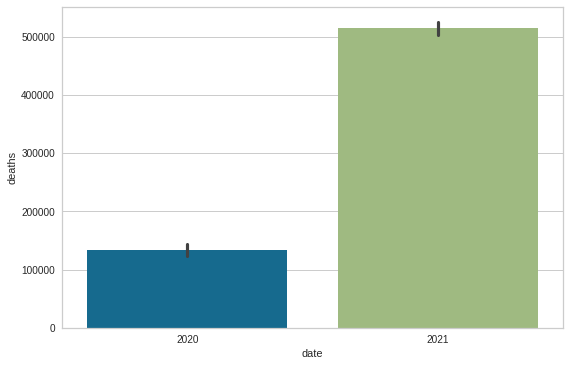

In [ ]:
sns.barplot(x=USCountry_DF['date'].dt.year, y='deaths', data=USCountry_DF)

In [ ]:
# death Rate calculation
USCountry_DF['DeathRate'] = round(USCountry_DF['deaths'] /USCountry_DF['cases'], 2)

In [ ]:
deathrate=px.bar(x=USCountry_DF['date'],y=USCountry_DF["DeathRate"])
deathrate.update_layout(title="US Death Rate Analysis",
                  xaxis_title="Date",yaxis_title="Death Rate in %",)
deathrate.show()

### Normal Probability - Mean, Standard Deviation Analysis

In [ ]:
US_ConfirmedCases=USCountry_DF["cases"]
US_deaths=USCountry_DF["deaths"]
US_death = US_deaths.dropna()

mean, std = US_ConfirmedCases.mean(), US_ConfirmedCases.std()
print(" Here are the mean and standard deviation of Variables in the State Dataset ")
mean, std

 Here are the mean and standard deviation of Variables in the State Dataset 


(12426345.542, 12108431.117040819)

In [ ]:
y=np.array(USStates_DF['cases'].dropna().values, dtype=float)
x=np.array(pd.to_datetime(USStates_DF['date'].dropna()).index.values, dtype=float)
slope, intercept, r_value, p_value, std_err =sp.linregress(x,y)
xf = np.linspace(min(x),max(x),100)
xf1 = xf.copy()
xf1 = pd.to_datetime(xf1)
yf = (slope*xf)+intercept
print('r = ', r_value, '\n', 'p = ', p_value, '\n', 's = ', std_err)

r =  0.4609384600078663 
 p =  0.0 
 s =  0.3505796837975354


In [ ]:
np.corrcoef(US_ConfirmedCases, US_deaths)

array([[1.        , 0.98801225],
       [0.98801225, 1.        ]])

### Predictive Modeling

In [ ]:
# Machine Learning Models
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer

from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

import yellowbrick
from yellowbrick.features import Rank2D

from sklearn.linear_model import LogisticRegression
from yellowbrick.classifier import ConfusionMatrix
from yellowbrick.classifier import ClassificationReport
from yellowbrick.classifier import ROCAUC

In [ ]:
pip install numpy scipy patsy pandas

In [ ]:
pip install statsmodels

In [ ]:
import warnings
import itertools
import numpy as np
import matplotlib.pyplot as plt
warnings.filterwarnings("ignore")
plt.style.use('fivethirtyeight')
import pandas as pd

import matplotlib
matplotlib.rcParams['axes.labelsize'] = 14
matplotlib.rcParams['xtick.labelsize'] = 12
matplotlib.rcParams['ytick.labelsize'] = 12
matplotlib.rcParams['text.color'] = 'k'

In [ ]:
USCountry_DF = USCountry_DF.sort_values('date')

In [ ]:
USCountry_DF.isnull().sum()

cases        0
deaths       0
fips         0
DeathRate    0
dtype: int64

In [ ]:
USCountry_DF = USCountry_DF.groupby('date')['deaths','cases'].sum().reset_index()

In [ ]:
USCountry_DF = USCountry_DF.set_index('date')
USCountry_DF.index

DatetimeIndex(['2020-01-21', '2020-01-22', '2020-01-23', '2020-01-24',
               '2020-01-25', '2020-01-26', '2020-01-27', '2020-01-28',
               '2020-01-29', '2020-01-30',
               ...
               '2021-05-25', '2021-05-26', '2021-05-27', '2021-05-28',
               '2021-05-29', '2021-05-30', '2021-05-31', '2021-06-01',
               '2021-06-02', '2021-06-03'],
              dtype='datetime64[ns]', name='date', length=500, freq=None)

In [ ]:
USCountry_DF

,deaths,cases
date,,
2020-01-21,0,1
2020-01-22,0,1
2020-01-23,0,1
2020-01-24,0,2
2020-01-25,0,3
...,...,...
2021-05-30,594053,33271953
2021-05-31,594203,33277510
2021-06-01,594723,33300002


In [ ]:
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]
print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


In [ ]:
import warnings
import itertools
import numpy as np
import matplotlib.pyplot as plt
warnings.filterwarnings("ignore")
plt.style.use('fivethirtyeight')
import pandas as pd
import statsmodels
import matplotlib
matplotlib.rcParams['axes.labelsize'] = 14
matplotlib.rcParams['xtick.labelsize'] = 12
matplotlib.rcParams['ytick.labelsize'] = 12
matplotlib.rcParams['text.color'] = 'k'

In [ ]:
import statsmodels.api as sm

In [ ]:
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(y,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            results = mod.fit()

            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

####  Plots Summary

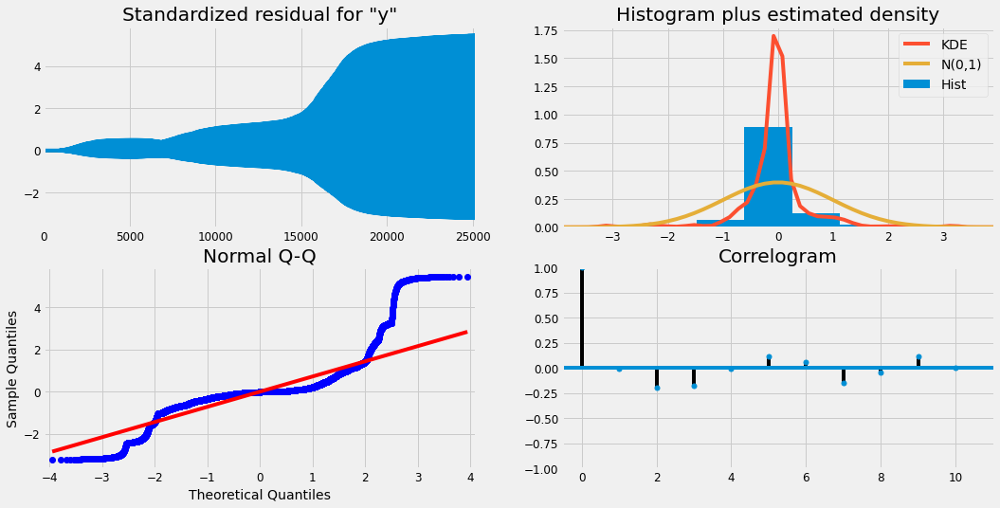

In [ ]:
results.plot_diagnostics(figsize=(16, 8))
plt.show()

####  Arima Model Fit

In [ ]:
# Ignore harmless warnings 
import warnings 
warnings.filterwarnings("ignore") 
  
# Fit auto_arima function to US Country dataset 
stepwise_fit = auto_arima(USCountry_DF['deaths'], start_p = 1, start_q = 1, 
                          max_p = 3, max_q = 3, m = 12, 
                          start_P = 0, seasonal = True, 
                          d = None, D = 1, trace = True, 
                          error_action ='ignore',   
                          suppress_warnings = True,   
                          stepwise = True)          
  
# show the the summaary of ARIMA output
stepwise_fit.summary() 

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=2.24 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=7989.662, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=7727.107, Time=0.99 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=7668.346, Time=1.30 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=7778.425, Time=0.23 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=inf, Time=2.56 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=7668.137, Time=3.19 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=7665.191, Time=9.73 sec
 ARIMA(0,1,1)(2,1,2)[12]             : AIC=7641.223, Time=8.24 sec
 ARIMA(0,1,1)(2,1,1)[12]             : AIC=7652.778, Time=3.10 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=7822.478, Time=5.54 sec
 ARIMA(1,1,1)(2,1,2)[12]             : AIC=inf, Time=12.34 sec
 ARIMA(0,1,2)(2,1,2)[12]             : AIC=inf, Time=7.30 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=inf, Time=10.50 sec
 ARIMA(1,1,2)(2,1,2)[12]             : AIC

<class 'statsmodels.iolib.summary.Summary'>
"""
                                        SARIMAX Results                                        
===============================================================================================
Dep. Variable:                                       y   No. Observations:                  500
Model:             SARIMAX(0, 1, 1)x(2, 1, [1, 2], 12)   Log Likelihood               -3814.611
Date:                                 Sat, 05 Jun 2021   AIC                           7641.223
Time:                                         15:54:49   BIC                           7666.352
Sample:                                              0   HQIC                          7651.095
                                                 - 500                                         
Covariance Type:                                   opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.6133      0.030     20.199      0.000       0.554       0.673
ar.S.L12      -0.2179      0.106     -2.047      0.041      -0.427      -0.009
ar.S.L24      -0.5972      0.065     -9.255      0.000      -0.724      -0.471
ma.S.L12      -0.2339      0.117     -2.004      0.045      -0.463      -0.005
ma.S.L24       0.4135      0.094      4.378      0.000       0.228       0.599
sigma2      3.688e+05   1.91e+04     19.293      0.000    3.31e+05    4.06e+05
===================================================================================
Ljung-Box (L1) (Q):                  14.14   Jarque-Bera (JB):                46.79
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               2.37   Skew:                            -0.21
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.46
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

#### Data Preparation for modelling - Train and Test

In [ ]:
split_date = "2020-08-01"
df_train = USCountry_DF.loc[: split_date].copy() 
df_test = USCountry_DF.loc[split_date :].copy()

In [ ]:
df_test

,deaths,cases
date,,
2020-08-01,154917,4628497
2020-08-02,155337,4679291
2020-08-03,155945,4726775
2020-08-04,157301,4780324
2020-08-05,158554,4834047
...,...,...
2021-05-30,594053,33271953
2021-05-31,594203,33277510
2021-06-01,594723,33300002


#### Fit Arima model for Deaths

In [ ]:
# Fit a SARIMAX(0, 1, 1)x(2, 1, 1, 12) on the training set 
from statsmodels.tsa.statespace.sarimax import SARIMAX 
  
model = SARIMAX(df_train['deaths'],  
                order = (0, 1, 1),  
                seasonal_order =(2, 1, 1, 12)) 
  
SARIMAX_Result = model.fit() 
SARIMAX_Result.summary() 

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                             deaths   No. Observations:                  194
Model:             SARIMAX(0, 1, 1)x(2, 1, 1, 12)   Log Likelihood               -1369.462
Date:                            Sat, 05 Jun 2021   AIC                           2748.923
Time:                                    15:55:03   BIC                           2764.916
Sample:                                01-21-2020   HQIC                          2755.407
                                     - 08-01-2020                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.6893      0.042     16.446      0.000       0.607       0.771
ar.S.L12       0.6331      0.086      7.347      0.000       0.464       0.802
ar.S.L24      -0.0100      0.098     -0.103      0.918      -0.202       0.182
ma.S.L12      -0.9943      1.396     -0.712      0.476      -3.730       1.741
sigma2      1.987e+05   2.59e+05      0.768      0.442   -3.08e+05    7.05e+05
===================================================================================
Ljung-Box (L1) (Q):                   6.20   Jarque-Bera (JB):                21.54
Prob(Q):                              0.01   Prob(JB):                         0.00
Heteroskedasticity (H):               8.80   Skew:                             0.42
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.47
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

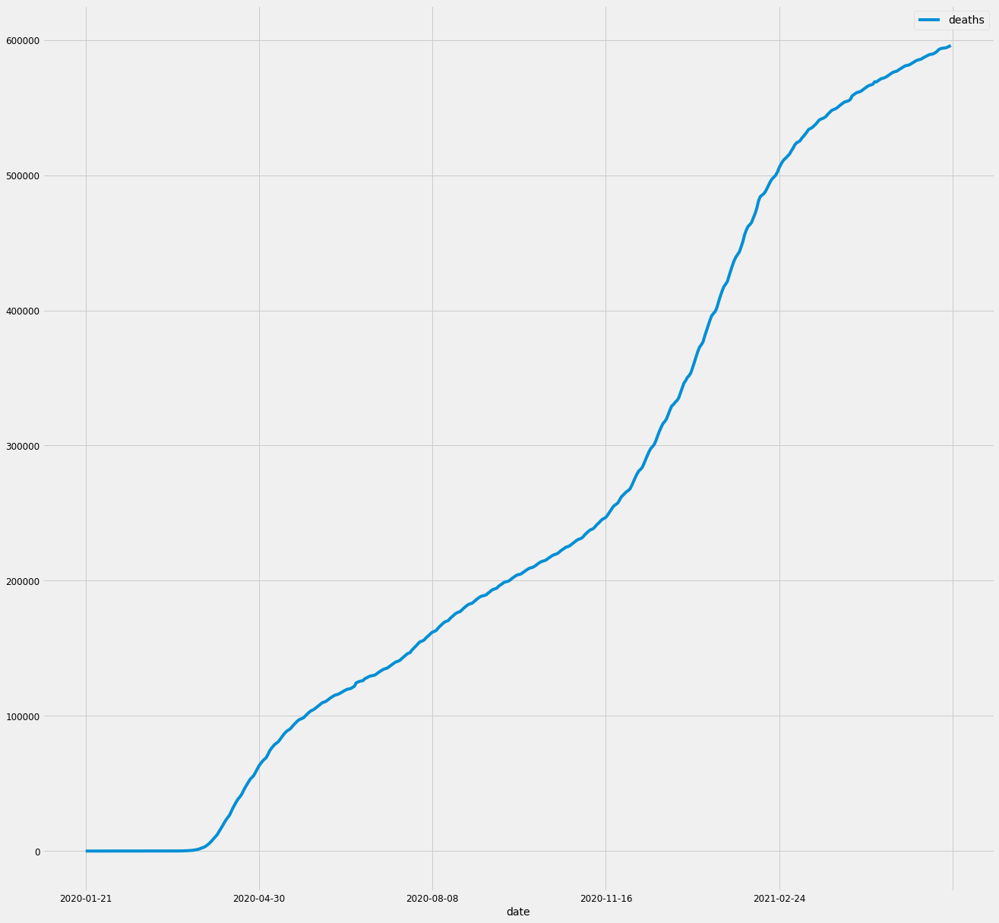

In [ ]:
model = SARIMAX(USCountry_DF['deaths'],  
                        order = (0, 1, 1),  
                        seasonal_order =(2, 1, 1, 12)) 
result = model.fit() 
  
# Forecast for the next 6 months 
forecast = result.predict(start = len(USCountry_DF),  
                          end = (len(USCountry_DF)-10) + 6 * 30,  
                          typ = 'levels').rename('Forecast') 
  
# death count  
USCountry_DF['deaths'].plot(figsize = (20, 20), legend = True) 
# forecast.plot(legend = True)

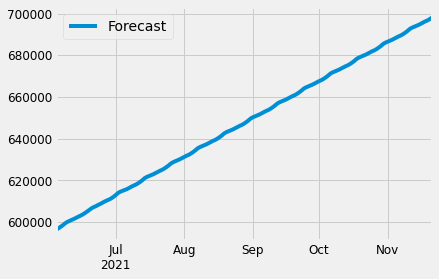

In [ ]:
forecast.plot(legend = True)

In [ ]:
# Fit a SARIMAX(0, 1, 1)x(2, 1, 1, 12) on the training set 
from statsmodels.tsa.statespace.sarimax import SARIMAX 
  
model = SARIMAX(df_train['cases'],  
                order = (0, 1, 1),  
                seasonal_order =(2, 1, 1, 12)) 
  
SARIMAX_Result = model.fit() 
SARIMAX_Result.summary() 

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              cases   No. Observations:                  194
Model:             SARIMAX(0, 1, 1)x(2, 1, 1, 12)   Log Likelihood               -1855.828
Date:                            Sat, 05 Jun 2021   AIC                           3721.656
Time:                                    16:05:46   BIC                           3737.649
Sample:                                01-21-2020   HQIC                          3728.140
                                     - 08-01-2020                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.7990      0.095      8.374      0.000       0.612       0.986
ar.S.L12       0.7416      1.814      0.409      0.683      -2.814       4.297
ar.S.L24      -0.2082      0.392     -0.530      0.596      -0.977       0.561
ma.S.L12      -0.5069      1.822     -0.278      0.781      -4.079       3.065
sigma2      7.792e+07   2.99e-08   2.61e+15      0.000    7.79e+07    7.79e+07
===================================================================================
Ljung-Box (L1) (Q):                  17.41   Jarque-Bera (JB):                 3.70
Prob(Q):                              0.00   Prob(JB):                         0.16
Heteroskedasticity (H):               3.25   Skew:                             0.20
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.58
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 6.02e+31. Standard errors may be unstable.
"""

In [ ]:
USCountry_DF

,deaths,cases
date,,
2020-01-21,0,1
2020-01-22,0,1
2020-01-23,0,1
2020-01-24,0,2
2020-01-25,0,3
...,...,...
2021-05-30,594053,33271953
2021-05-31,594203,33277510
2021-06-01,594723,33300002


## Final Prediction of Confirmed Cases - ARIMA Model - Time Series Forecasting Confirmed Cases ( Next 9 Months )

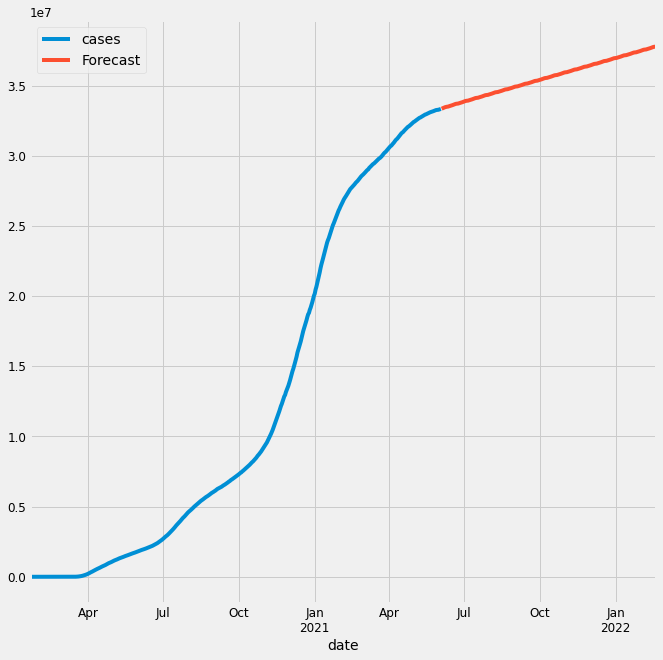

In [ ]:
model = SARIMAX(USCountry_DF['cases'],  
                        order = (0, 1, 1),  
                        seasonal_order =(2, 1, 1, 12)) 
result = model.fit() 
  
# Forecast for the next 3 months 
forecast = result.predict(start = len(USCountry_DF),  
                          end = (len(USCountry_DF)-10) + 9 * 30,  
                          typ = 'levels').rename('Forecast') 
  
# death count  
USCountry_DF['cases'].plot(figsize = (10, 10), legend = True) 
forecast.plot(legend = True)



####  **As part of the above prediction shows that by next year January, the confirmed Cases count may reach to around 3.7 M. **

## Final Prediction of Deaths - ARIMA Model - Time Series Forecasting Deaths 
( Next 9 Months )

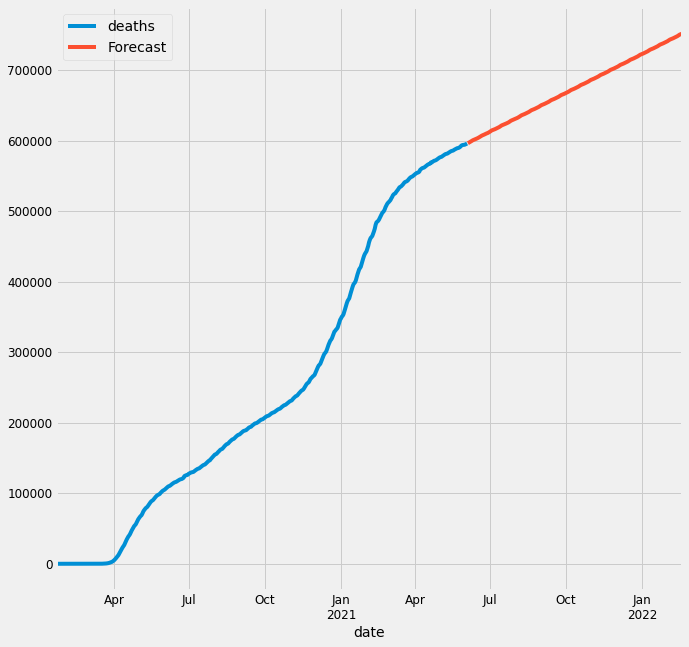

In [ ]:
model = SARIMAX(USCountry_DF['deaths'],  
                        order = (0, 1, 1),  
                        seasonal_order =(2, 1, 1, 12)) 
result = model.fit() 
  
# Forecast for the next 9 months 
forecast = result.predict(start = len(USCountry_DF),  
                          end = (len(USCountry_DF)-10) + 9 * 30,  
                          typ = 'levels').rename('Forecast') 
  
# death count  
USCountry_DF['deaths'].plot(figsize = (10, 10), legend = True) 
forecast.plot(legend = True)

####  **As part of the above prediction shows that by next year January, the death count may reach to around 710 K. **

In [ ]:
USCountry_DF = USCountry_DF.groupby('date')['deaths','cases'].sum().reset_index()
USCountry_DF = USCountry_DF.sort_values('date')
y=USCountry_DF.set_index('date')
y.head(5)

,deaths,cases
date,,
2020-01-21,0,1
2020-01-22,0,1
2020-01-23,0,1
2020-01-24,0,2
2020-01-25,0,3


## Deaths vs Confirmed Cases

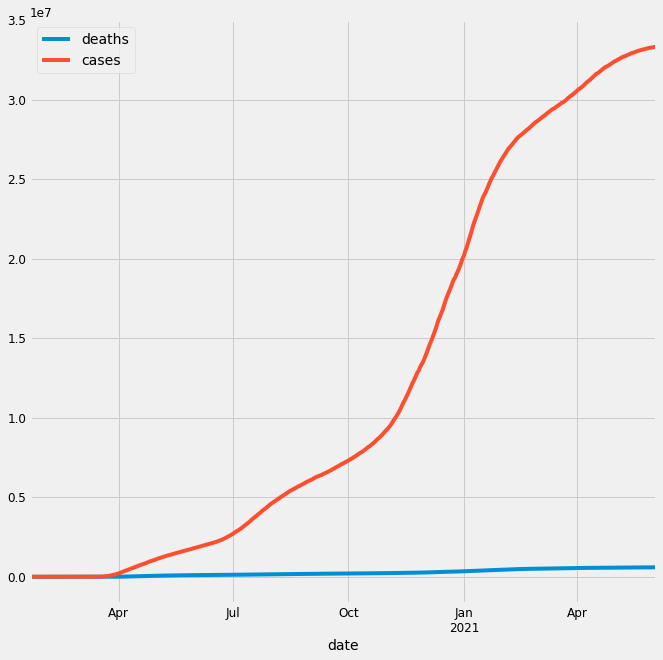

In [ ]:
y.plot(figsize=(10, 10))
plt.show()

In [ ]:
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]
print('Examples of parameter for SARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Examples of parameter for SARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


In [ ]:
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(y,order=param,seasonal_order=param_seasonal,enforce_stationarity=False,enforce_invertibility=False)
            results = mod.fit()
            print('ARIMA{}x{}12 - AIC:{}'.format(param,param_seasonal,results.aic))
        except: 
            continue

ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:14069.318819378132
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:13394.517202400948
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:10925.172198092092
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:10087.521887479696
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:10547.56673191463
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:10224.258566572606
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:9391.950733202364
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:9280.580980449553
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:13672.064294556087
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:13976.135301882656
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:10542.890948082646
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:10203.17598267146
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:13278.324625888203
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:13225.82111022418
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:10215.759401025349
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:8680.4290815751
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:8741.672554769913
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:8188.249760098395
AR

## Final Mode Prediction - Summary

In [ ]:
mod = sm.tsa.statespace.SARIMAX(y,
                                order=(0, 0, 1),
                                seasonal_order=(1, 1, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results = mod.fit()
print(results.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.9999      0.237      4.219      0.000       0.535       1.464
ar.S.L12       0.9410      0.013     70.045      0.000       0.915       0.967
ma.S.L12       2.7689      0.328      8.445      0.000       2.126       3.412
sigma2      6.769e+05   3.31e-07   2.04e+12      0.000    6.77e+05    6.77e+05


## Final Mode Prediction -for next 6 Months

In [ ]:
forecast

2021-06-04    596411.273443
2021-06-05    597023.602138
2021-06-06    597740.197652
2021-06-07    598503.521700
2021-06-08    599396.723293
                  ...      
2021-11-17    695685.906708
2021-11-18    696228.406946
2021-11-19    696684.847906
2021-11-20    697299.772688
2021-11-21    698024.708153
Freq: D, Name: Forecast, Length: 171, dtype: float64

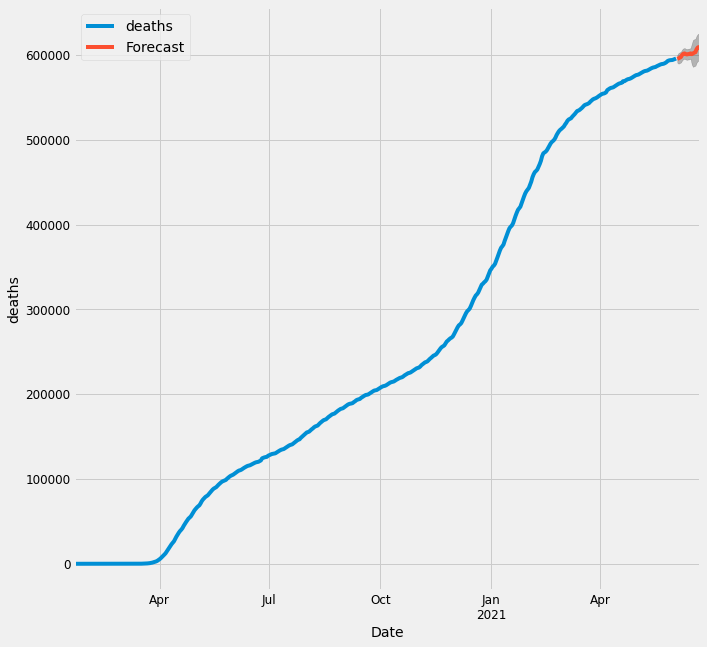

In [ ]:
pred_uc = results.get_forecast(steps=20)
pred_ci = pred_uc.conf_int()
ax = y.plot(label='observed', figsize=(10, 10))
pred_uc.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('deaths')
plt.legend()
plt.show()

In [ ]:
y_forecasted = pred.predicted_mean
y_truth = y['2020-06-01':]
mse = ((y_forecasted - y_truth) ** 2).mean()
print('The Mean Squared Error is {}'.format(round(mse, 2)))
print('The Root Mean Squared Error is {}'.format(round(np.sqrt(mse), 2)))

The Mean Squared Error is 2020-07-01 00:00:00   NaN
2020-07-02 00:00:00   NaN
2020-07-03 00:00:00   NaN
2020-07-04 00:00:00   NaN
2020-07-05 00:00:00   NaN
                       ..
2021-05-31 00:00:00   NaN
2021-06-01 00:00:00   NaN
2021-06-02 00:00:00   NaN
2021-06-03 00:00:00   NaN
deaths                NaN
Length: 339, dtype: float64
The Root Mean Squared Error is 2020-07-01 00:00:00   NaN
2020-07-02 00:00:00   NaN
2020-07-03 00:00:00   NaN
2020-07-04 00:00:00   NaN
2020-07-05 00:00:00   NaN
                       ..
2021-05-31 00:00:00   NaN
2021-06-01 00:00:00   NaN
2021-06-02 00:00:00   NaN
2021-06-03 00:00:00   NaN
deaths                NaN
Length: 339, dtype: float64


In [ ]:
y_forecasted = pred.predicted_mean
y_forecasted.head(12)

2020-07-01    127057.475933
2020-07-02    128216.141761
2020-07-03    127076.851658
2020-07-04    128685.901708
2020-07-05    128307.397882
2020-07-06    129483.495004
2020-07-07    133401.066807
2020-07-08    131848.006042
2020-07-09    135075.974779
2020-07-10    132393.527233
2020-07-11    135987.224983
2020-07-12    135241.867395
Freq: D, Name: predicted_mean, dtype: float64

## Predicated Death Count Max and Min Values

In [ ]:
pred_ci.head(50)

,lower deaths,upper deaths
2021-06-04,591084.810201,600023.854514
2021-06-05,589801.132053,602429.884320
2021-06-06,590555.925335,603184.677601
2021-06-07,591329.476157,603958.228423
2021-06-08,593820.789211,606449.541477
2021-06-09,595195.361953,607824.114219
2021-06-10,595596.611257,608225.363523
2021-06-11,594746.676375,607375.428642
2021-06-12,594410.584530,607039.336796
2021-06-13,594773.061012,607401.813278


### Linear Regression - Death vs Cases ( ordinary least squares )

In [ ]:
# ordinary least squares.
model = smf.ols('deaths ~ cases', data=USCountry_DF)
results = model.fit()
results.summary()

###  Logistic Regression Analysis of Death Rate with Confirmed, Death Cases

In [ ]:
formula='DeathRate ~ cases + deaths'
model = sm.Logit.from_formula(formula, USCountry_DF).fit()
print(model.summary())

## NULL Hypothesis Verification - HypothesisTest

In [ ]:
train_size=int(len(y) *0.7)
test_size = int(len(y))- train_size
train_X, train_y = X[:train_size].dropna(), y[:train_size].dropna()
test_X, test_y = X[train_size:].dropna(), y[train_size:].dropna()

In [ ]:
from statsmodels.tsa.stattools import adfuller
def test_adf(series, title=''):
    dfout={}
    dftest=sm.tsa.adfuller(series.dropna(), autolag='AIC', regression='ct')
    for key,val in dftest[4].items():
        dfout[f'critical value ({key})']=val
    if dftest[1]<=0.05:
        print("Strong evidence against Null Hypothesis")
        print("Reject Null Hypothesis - Data is Stationary")
        print("Data is Stationary", title)
    else:
        print("Strong evidence for  Null Hypothesis")
        print("Accept Null Hypothesis - Data is not Stationary")
        print("Data is NOT Stationary for", title)

In [ ]:
y_test=y['deaths'][:train_size].dropna()
test_adf(y_test, "deaths")

Strong evidence for  Null Hypothesis
Accept Null Hypothesis - Data is not Stationary
Data is NOT Stationary for deaths


In [ ]:
test_adf(y_test.diff(), 'deaths')

Strong evidence for  Null Hypothesis
Accept Null Hypothesis - Data is not Stationary
Data is NOT Stationary for deaths


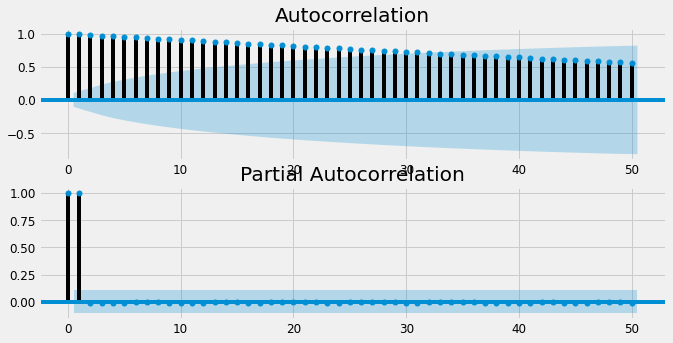

In [ ]:
fig,ax= plt.subplots(2,1, figsize=(10,5))
fig=sm.tsa.graphics.plot_acf(y_test, lags=50, ax=ax[0])
fig=sm.tsa.graphics.plot_pacf(y_test, lags=50, ax=ax[1])
plt.show()

#  India - COVID19 - Trends and Outbreak Prediction of Spread

In [ ]:
import pandas as pd  
import numpy as np  
import matplotlib.pyplot as plt   
from sklearn.model_selection import train_test_split 
from sklearn import metrics

####  Data Load

In [ ]:
state_df = pd.read_csv('StatewiseTestingDetails.csv')
country_df = pd.read_csv('covid_19_india.csv')
vaccine_df = pd.read_csv('covid_vaccine_statewise.csv')

In [ ]:
state_df[state_df['State']=='Tamil Nadu'].head()

,Date,State,TotalSamples,Negative,Positive
11447,2020-04-03,Tamil Nadu,3684.0,2789,411.0
11448,2020-04-08,Tamil Nadu,5305.0,4414,690.0
11449,2020-04-09,Tamil Nadu,7267.0,5824,834.0
11450,2020-04-10,Tamil Nadu,8410.0,6838,911.0
11451,2020-04-11,Tamil Nadu,9842.0,7779,969.0


####  EDA

In [ ]:
country_df[((country_df['Date']=='2021-04-04')&(country_df['State/UnionTerritory']=='Tamil Nadu'))]

,Sno,Date,Time,State/UnionTerritory,ConfirmedIndianNational,ConfirmedForeignNational,Cured,Deaths,Confirmed
13460,13461,2021-04-04,8:00 AM,Tamil Nadu,-,-,863258,12764,896226


In [ ]:
df=country_df.copy()

In [ ]:
# convert the Date feature to Date&time datatype
df['Date']=pd.to_datetime(df['Date'],format='%Y-%m-%d')

#Time is not required as it doesnt make much difference
df.drop(['Time'],axis=1, inplace=True)

#Renaming State/UnionTerritory to States for easy reference
df.rename(columns={'State/UnionTerritory':'States'}, inplace=True)

In [ ]:
df['Active_cases']=df['Confirmed']-(df['Cured']+df['Deaths'])

In [ ]:
df[df['States']=='Tamil Nadu'].tail()

,Sno,Date,States,ConfirmedIndianNational,ConfirmedForeignNational,Cured,Deaths,Confirmed,Active_cases
15404,15405,2021-05-28,Tamil Nadu,-,-,1643284,22289,1978621,313048
15440,15441,2021-05-29,Tamil Nadu,-,-,1674539,22775,2009700,312386
15476,15477,2021-05-30,Tamil Nadu,-,-,1706298,23261,2039716,310157
15512,15513,2021-05-31,Tamil Nadu,-,-,1739280,23754,2068580,305546
15548,15549,2021-06-01,Tamil Nadu,-,-,1770503,24232,2096516,301781


## Visualizations - Top 10 States with Active Cases

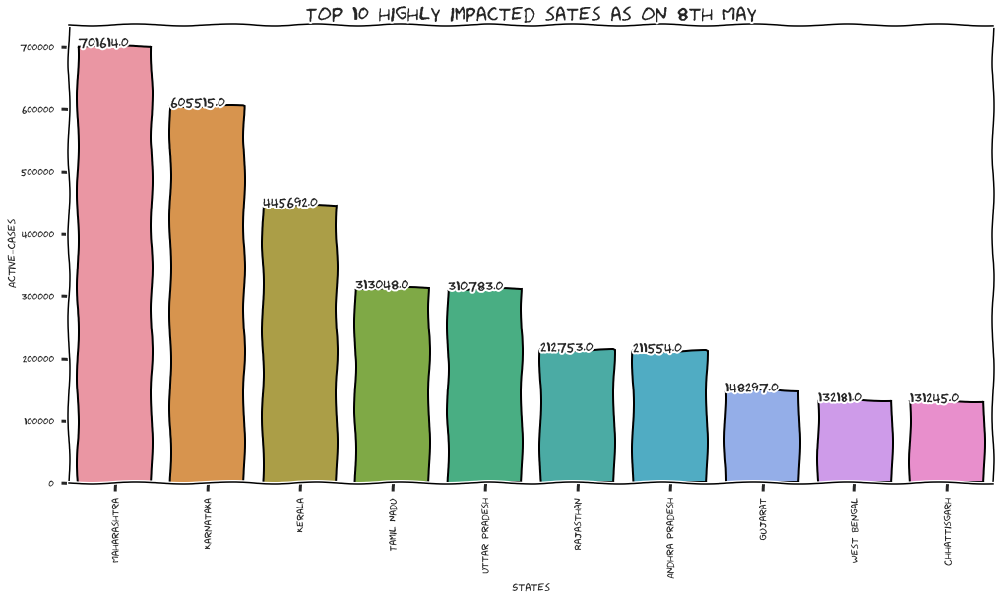

In [ ]:
top_10=df.groupby(by='States').max()[['Active_cases','Date']].sort_values(by=['Active_cases'],ascending=False).reset_index()
with plt.xkcd():
    fig=plt.figure(figsize=(15,8))
    plt.title("Top 10 highly impacted sates as on 8th May", size=20)
    ax=sns.barplot(data=top_10.iloc[:10],y='Active_cases',x='States', linewidth=2, edgecolor='black')
    ax.set_xticklabels(labels=ax.get_xticklabels(),rotation=90)
    for i in ax.patches:
        ax.text(x=i.get_x(),y=i.get_height(),s=i.get_height())

##  State Level - Prediction of Confirmed Cases - ARIMA Model - Time Series Forecasting

In [ ]:
#Finding our Daily cases for the data
tn_count=df[df['States']=='Tamil Nadu']
daily=[]
daily.append(0)
for i in range(1, len(tn_count)):
    daily.append(tn_count['Confirmed'].iloc[i]-tn_count['Confirmed'].iloc[i-1])
tn_count['Daily']=daily

In [ ]:
from fbprophet import Prophet
ds=pd.DataFrame(columns=['ds','y'])

ds['ds']=tn_count['Date']
ds['y']=tn_count['Daily']
model = Prophet(changepoint_range=1)
model.fit(ds)
future = model.make_future_dataframe(periods=20)
f=model.predict(future)
f['ds']=pd.to_datetime(f['ds'], format='%Y-%m-%d')

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


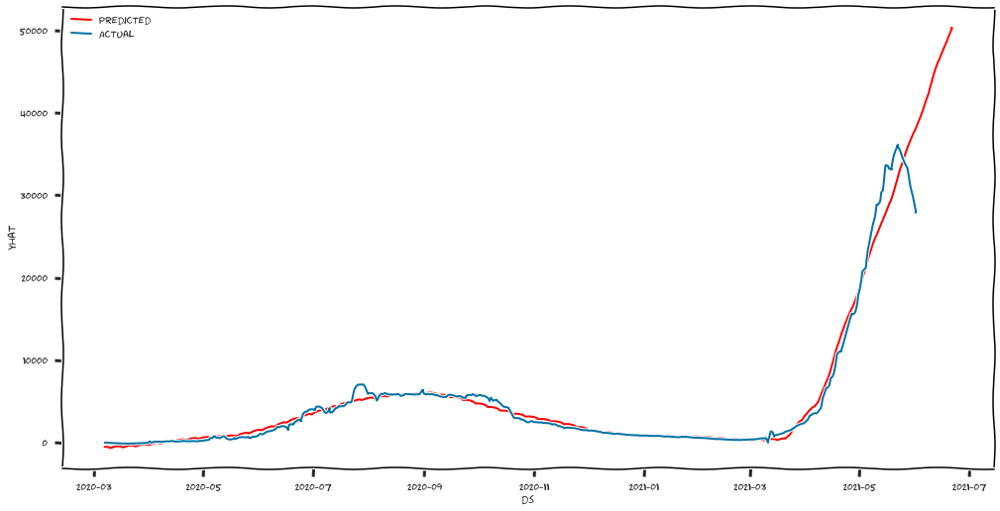

In [ ]:
today=f[f['ds']=='2021-06-11 00:00:00']
with plt.xkcd():
    fig=plt.figure(figsize=(15,8))
    
        
    ax=sns.lineplot(data=f, x='ds',y='yhat', alpha=1, color='red')
    ax=sns.lineplot(data=tn_count, x='Date',y='Daily')
   
    
 
    ax.legend(labels=['Predicted','Actual'], loc='upper left')
    

####  **As part of the above prediction shows that by next month, the Confimred Cases count may reach to around 50 K on a given day. **

## Conclusion

As part of this project, I have analyzed various techniques to perform the EDA of COVID19 Trends and Outbreak Prediction of Spread in USA and India.

The below are the outcomes of my EDA 

1. Calculated DeathRate Ratio - From Feb 29,2020 to Nov 18,2020, overall Death Count is 250K. Initially Death Ratio was increased and it started gradually decreasing from July,2020

2. Number of Death : Number of deaths is increasing day by day ( as of Nov 18 )

3. Confirmed Cases : Number of positive Count is increasing day by day ( as of Nov 18 ) - 11.61 M 

4. State Level Cases : Created Animation plot for State Level counts on daily basis. ( Both Confirmed and Death count )
   observed NY State count had highest counts.

5. Based on the Data as of June 5,2021, The prediction of Death count on January 31,2022 is 710K
    

6. Based on the Data as of June 5,2021, The prediction of Confirmed Cases count on January 31,2022 is 33 Million

    Based on the Data as of June 5,2021, The prediction of Confirmed Cases in India count on January next month going to be 50 K
    
    
7. Verified various Analysis through various Regression, Charts and Probability function to verify the accuracy

8. Compared the model with prediction and actual values to make sure the steps we followed

9. Performed Variuos Tred Analysis and Hypothesis Test, P-Value findings

10. Created Animation for State Level count with Date Level
    
The below are various techniques I used in this project to perform the Detailed EDA of COVID19 Trends and Outbreak Prediction of Spread in USA 

As of November 21,2020, We are hearing that vaccination is going to provided to people and I hope this will help to stop the COVID Spread and deaths.

My sincere Thanks to Professor Dr.Brett Werner for all his guidance and support on this semester which helped me to perfume this detailed analysis of COVID Spread in USA and India.

## References:

1.  We’re Sharing Coronavirus Case Data for Every U.S. County by NY Times

        https://www.nytimes.com/article/coronavirus-county-data-us.html


2.  Coronavirus Disease 2019 (COVID-19)

        https://covid.cdc.gov/covid-data-tracker/?CDC_AA_refVal=https%3A%2F%2Fwww.cdc.gov%2Fcoronavirus%2F2019-ncov%2Fcases-             updates%2Fcases-in-us.html#cases_casesinlast7days


3.  Analyze NY Times Covid-19 Dataset, Medium

        https://towardsdatascience.com/analyze-ny-times-covid-19-dataset-86c802164210


4.  HOW TO USE DATA ANALYSIS FOR MACHINE LEARNING by Sharp Sight

        https://www.sharpsightlabs.com/blog/data-analysis-machine-learning-example-1/ 


5.  Python | ARIMA Model for Time Series Forecasting by geeksforgeeks

        https://www.geeksforgeeks.org/python-arima-model-for-time-series-forecasting/


6.  Modeling COVID-19 epidemic with Python Medium

        https://towardsdatascience.com/modeling-covid-19-epidemic-with-python-bed21b8f6baf
        
7.  https://www.kaggle.com/dhrupal1289/covid-analysis-prediction